# Reblog logistic regression with statsmodels 

In [23]:
# LDA top terms (from check_models.ipynb)
topic_terms = [['me', 'sexy', 'nude', 'sex', 'hot', 'porn', 'pretty_girls',
        'tits', 'cute_girls', 'beauty'],
       ['q', 'photography', 'nature', 'culo', 'words', 'landscape',
        'architecture', 'summer', 'reference', 'beach'],
       ['gif', 'marvel', 'love', '1k', 'aes', 'comics', 'mcu', 'asks',
        'steve_rogers', 'exo'],
       ['anonymous', 'daddy', 'boy', 'lgbt', 'happy', 'man', 'follow',
        'bareback', 'men', 'clip'],
       ['nsfw', 'video', 'cute', 'animals', 'fave', 'aesthetic', 'mood',
        'doctor_who', 'long_post', 'anal'],
       ['reblog', 'fanart', 'lol', 'voltron', 'pokemon', 'omg',
        'fan_art', 'gifs', 'quotes', 'sheith'],
       ['my_art', 'anime', 'lmao', 'wow', 'supernatural', 'pink',
        'flowers', 'audio', 'writing', 'pretty'],
       ['fashion', 'personal', 'funny', 'memes', 'gayman', 'polla',
        'overwatch', 'meme', 'about_me', 'yes'],
       ['text', 'mine', 'bts', 'bnha', 'music', 'food', 'photo', '*',
        'disney', 'ask'],
       ['art', 'queue', 'fav', 'illustration', 'vintage', 'cats', 'hp',
        'black_and_white', 'artists_on_tumblr', 'inspiration']]
topics = [' '.join(terms[:5]) for terms in topic_terms]

# Load experimental dataset
import pickle

# path = '/projects/tumblr_community_identity/tmp/post_tags+comms_tags_lr_data.pkl'
path = '/projects/tumblr_community_identity/tmp/post+comms_tags_lr_data.pkl'
with open(path, 'rb') as f:
    X_train, y_train, X_dev, y_dev, X_test, y_test = pickle.load(f)
X_train.shape

import pandas as pd
import numpy as np

X = np.vstack([X_train, X_dev, X_test])
y = np.vstack([y_train.reshape(-1,1), y_dev.reshape(-1,1), y_test.reshape(-1,1)])

# df = pd.DataFrame(np.hstack([X, y]), columns=[f'topic{i}' for i in range(10)] + ['comm_match_follower-followee', 'reblog_order'])
# cols = [f'topic{i}' for i in range(10)]
cols = topics
cols += ['post_note_count']
# cols += [f'post_type{i}' for i in range(8)]
cols += 'answer, audio, chat, link, photo, quote, text, video'.split(', ')
cols += ['comm_match_follower_followee']
cols += ['reblog_order']
data = pd.DataFrame(np.hstack([X, y]), columns=cols)
data

,me sexy nude sex hot,q photography nature culo words,gif marvel love 1k aes,anonymous daddy boy lgbt happy,nsfw video cute animals fave,reblog fanart lol voltron pokemon,my_art anime lmao wow supernatural,fashion personal funny memes gayman,text mine bts bnha music,art queue fav illustration vintage,...,answer,audio,chat,link,photo,quote,text,video,comm_match_follower_followee,reblog_order
0,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-1.551784,5.356253,0.006964,-0.002306,-0.000249,1.0
1,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,-1.831829,-0.002306,-0.000249,0.0
2,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
3,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-2.074561,1.0
4,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,-1.831829,-0.002306,-0.000249,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110893,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
110894,0.546079,0.793551,0.69749,0.404492,0.603141,0.698564,0.772239,0.790589,-5.750781,0.60130,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
110895,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,0.0
110896,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-1.551784,-0.001449,0.006964,2.643651,-0.000249,0.0


## Check, manipulate data

### Filter

In [57]:
# Select instances with nonzero hashtag topic elements
threshold = 0.02

topic_cols = [col for col in data.columns if 'topic' in col]
filtered = data.loc[(abs(data[topic_cols]) > threshold).any(axis=1)]
filtered

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,...,post_type0,post_type1,post_type2,post_type3,post_type4,post_type5,post_type6,post_type7,comm_match_follower_followee,reblog_order
6,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,-0.450000,0.050000,...,0.0,0.0,0.0,0.0,-1.0,0.0,1.0,0.0,0.0,1.0
16,0.083333,-0.083333,0.083333,0.083333,0.083333,-0.083334,-0.083333,0.083333,-0.250000,0.083333,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
18,0.080000,0.080000,0.080000,-0.719996,0.080000,0.080000,0.079996,0.080000,0.080000,0.080000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
22,-0.008333,-0.008333,0.241667,-0.008333,-0.008333,-0.008333,-0.341666,0.241666,-0.341667,0.241666,...,0.0,0.0,0.0,0.0,1.0,0.0,-1.0,0.0,1.0,1.0
27,0.074998,0.075000,0.075000,0.074999,0.075000,0.075000,-0.175001,-0.424996,0.075000,0.074999,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110850,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,0.050000,-0.450000,...,1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0
110868,-0.008333,-0.008333,-0.008341,-0.008333,-0.008333,0.408341,-0.341667,-0.008333,-0.008333,-0.008333,...,1.0,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,1.0
110876,-0.075000,-0.075000,-0.074999,0.174996,-0.074998,-0.075000,-0.075000,-0.075000,0.425001,-0.075000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
110880,-0.174995,-0.175001,0.075000,0.075000,0.075000,-0.175001,0.075000,0.075000,0.075000,0.074997,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Plot

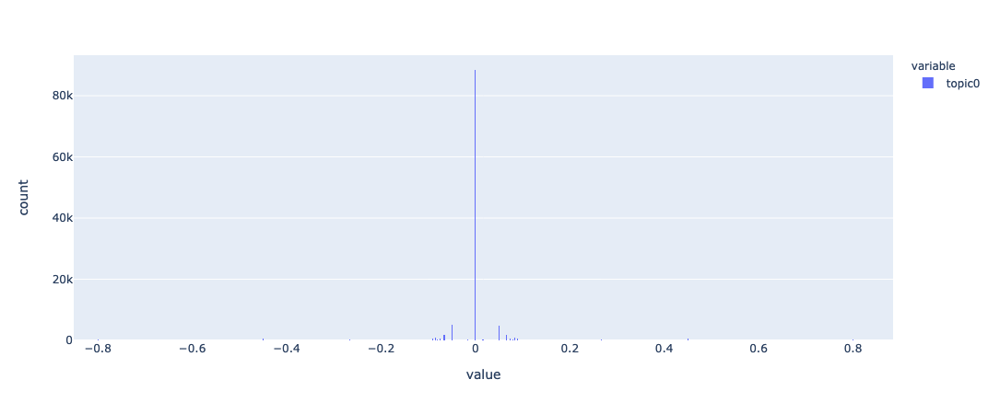

In [35]:
# Check distributions of values for each hashtag topic
import plotly.express as px
px.histogram(data.topic0)
# px.histogram(filtered.topic0)

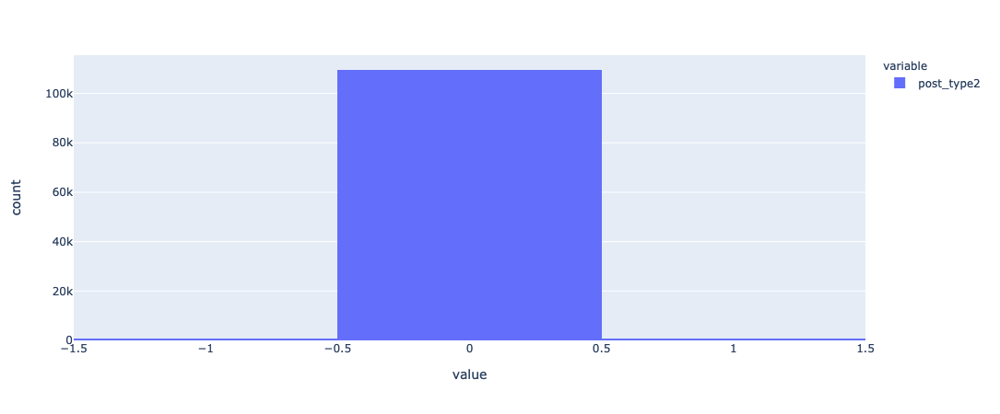

In [36]:
px.histogram(data.post_type2)

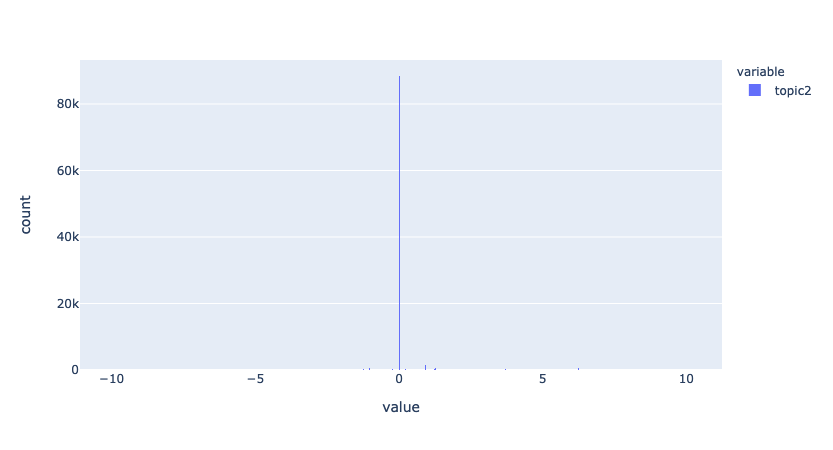

In [12]:
px.histogram(data.topic2)

## Run LR

In [20]:
# Make interaction columns

tag_cols = data[data.columns[:10]]
type_cols = data[data.columns[-10:-2]]

for col in tag_cols:
    data[f'comm_match_{col}'] = data['comm_match_follower_followee'] * data[col]
    
data.columns

Index(['me sexy nude sex hot', 'q photography nature culo words',
       'gif marvel love 1k aes', 'anonymous daddy boy lgbt happy',
       'nsfw video cute animals fave', 'reblog fanart lol voltron pokemon',
       'my_art anime lmao wow supernatural',
       'fashion personal funny memes gayman', 'text mine bts bnha music',
       'art queue fav illustration vintage', 'post_note_count', 'answer',
       'audio', 'chat', 'link', 'photo', 'quote', 'text', 'video',
       'comm_match_follower_followee', 'reblog_order',
       'comm_match_me sexy nude sex hot',
       'comm_match_q photography nature culo words',
       'comm_match_gif marvel love 1k aes',
       'comm_match_anonymous daddy boy lgbt happy',
       'comm_match_nsfw video cute animals fave',
       'comm_match_reblog fanart lol voltron pokemon',
       'comm_match_my_art anime lmao wow supernatural',
       'comm_match_fashion personal funny memes gayman',
       'comm_match_text mine bts bnha music',
       'comm_match_ar

In [27]:
# Save data table out
# df.to_csv('/projects/tumblr_community_identity/tmp/tumblr_reblog_prediction_features_lda10.csv', index=False)
data.to_csv('/projects/tumblr_community_identity/tmp/tumblr_reblog_prediction_post_lda10.csv', index=False)

In [24]:
# Run LR (this run with interaction terms)
import statsmodels.api as sm

X = sm.add_constant(data.drop(columns=['reblog_order']))
y = data.reblog_order
logit = sm.GLM(y, X, family=sm.families.Binomial())
result = logit.fit()

# Logit way
# logit = sm.Logit(y, X)
# result = logit.fit(method='nm', disp=2, maxiter=100000)

print(result.summary())

predictors = result.summary2().tables[1]
sig = predictors.loc[predictors['P>|z|']<0.05].sort_values('Coef.', ascending=False)
sig

                 Generalized Linear Model Regression Results                  
Dep. Variable:           reblog_order   No. Observations:               110898
Model:                            GLM   Df Residuals:                   110879
Model Family:                Binomial   Df Model:                           18
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -71010.
Date:                Sun, 27 Jun 2021   Deviance:                   1.4202e+05
Time:                        15:56:28   Pearson chi2:                 1.10e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
co

,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
post_note_count,0.494049,0.007005,70.527302,0.000000e+00,0.480319,0.507779
anonymous daddy boy lgbt happy,0.295452,0.007174,41.185849,0.000000e+00,0.281392,0.309513
comm_match_follower_followee,0.143410,0.006386,22.458014,1.068577e-111,0.130895,0.155926
text,0.067934,0.004519,15.033469,4.431735e-51,0.059077,0.076790
quote,0.064302,0.006116,10.513623,7.476468e-26,0.052314,0.076289
video,0.063783,0.005773,11.049011,2.216426e-28,0.052469,0.075098
chat,0.018837,0.006331,2.975520,2.924927e-03,0.006429,0.031245
me sexy nude sex hot,0.012973,0.005567,2.330395,1.978528e-02,0.002062,0.023884
reblog fanart lol voltron pokemon,-0.031293,0.006115,-5.117153,3.101825e-07,-0.043279,-0.019307
my_art anime lmao wow supernatural,-0.045672,0.006175,-7.395841,1.405159e-13,-0.057776,-0.033569


In [26]:
sig[['Coef.', 'P>|z|']].round(3)

,Coef.,P>|z|
post_note_count,0.494,0.000
anonymous daddy boy lgbt happy,0.295,0.000
comm_match_follower_followee,0.143,0.000
text,0.068,0.000
quote,0.064,0.000
video,0.064,0.000
chat,0.019,0.003
me sexy nude sex hot,0.013,0.020
reblog fanart lol voltron pokemon,-0.031,0.000
my_art anime lmao wow supernatural,-0.046,0.000


In [22]:
# Run LR (this run with interaction terms)
import statsmodels.api as sm

X = sm.add_constant(data.drop(columns=['reblog_order']))
y = data.reblog_order
logit = sm.GLM(y, X, family=sm.families.Binomial())
result = logit.fit()

# Logit way
# logit = sm.Logit(y, X)
# result = logit.fit(method='nm', disp=2, maxiter=100000)

print(result.summary())

predictors = result.summary2().tables[1]
sig = predictors.loc[predictors['P>|z|']<0.05].sort_values('Coef.', ascending=False)
sig

                 Generalized Linear Model Regression Results                  
Dep. Variable:           reblog_order   No. Observations:               110898
Model:                            GLM   Df Residuals:                   110870
Model Family:                Binomial   Df Model:                           27
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -71006.
Date:                Sun, 27 Jun 2021   Deviance:                   1.4201e+05
Time:                        15:29:25   Pearson chi2:                 1.10e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

,Coef.,Std.Err.,z,P>|z|,[0.025,0.975]
post_note_count,0.494624,0.007016,70.498946,0.000000e+00,0.480873,0.508375
anonymous daddy boy lgbt happy,0.296862,0.007621,38.952135,0.000000e+00,0.281925,0.311799
comm_match_follower_followee,0.143385,0.006397,22.415716,2.765547e-111,0.130848,0.155922
text,0.067973,0.004529,15.008260,6.482623e-51,0.059096,0.076850
quote,0.064414,0.006090,10.577847,3.775347e-26,0.052479,0.076349
video,0.063886,0.005801,11.013512,3.289254e-28,0.052517,0.075256
chat,0.018852,0.006363,2.962592,3.050603e-03,0.006380,0.031324
me sexy nude sex hot,0.012845,0.005629,2.281905,2.249494e-02,0.001812,0.023878
reblog fanart lol voltron pokemon,-0.032619,0.006012,-5.425407,5.782254e-08,-0.044403,-0.020835
my_art anime lmao wow supernatural,-0.045649,0.006143,-7.431258,1.075697e-13,-0.057688,-0.033609


# Propensity score analysis to see community feature effect size 

In [2]:
# Load reblog prediction data
# Load experimental dataset
import pickle

# path = '/projects/tumblr_community_identity/tmp/post_tags+comms_tags_lr_data.pkl'
path = '/projects/tumblr_community_identity/tmp/post+comms_tags_lr_data.pkl'
with open(path, 'rb') as f:
    dataset = pickle.load(f)
dataset.keys()

dict_keys(['data', 'data_location', 'X_train', 'X_dev', 'X_test', 'y_train', 'y_dev', 'y_test', 'index_train', 'index_dev', 'organization', 'filter_settings', 'index_test'])

In [9]:
import pandas as pd
import numpy as np

X = np.vstack([dataset['X_train'], dataset['X_dev'], dataset['X_test']])
y = np.vstack([dataset['y_train'].reshape(-1,1), dataset['y_dev'].reshape(-1,1), dataset['y_test'].reshape(-1,1)])
index = dataset['index_train'].tolist() + dataset['index_dev'].tolist() + dataset['index_test'].tolist()

# LDA top terms (from check_models.ipynb)
topic_terms = [['me', 'sexy', 'nude', 'sex', 'hot', 'porn', 'pretty_girls',
        'tits', 'cute_girls', 'beauty'],
       ['q', 'photography', 'nature', 'culo', 'words', 'landscape',
        'architecture', 'summer', 'reference', 'beach'],
       ['gif', 'marvel', 'love', '1k', 'aes', 'comics', 'mcu', 'asks',
        'steve_rogers', 'exo'],
       ['anonymous', 'daddy', 'boy', 'lgbt', 'happy', 'man', 'follow',
        'bareback', 'men', 'clip'],
       ['nsfw', 'video', 'cute', 'animals', 'fave', 'aesthetic', 'mood',
        'doctor_who', 'long_post', 'anal'],
       ['reblog', 'fanart', 'lol', 'voltron', 'pokemon', 'omg',
        'fan_art', 'gifs', 'quotes', 'sheith'],
       ['my_art', 'anime', 'lmao', 'wow', 'supernatural', 'pink',
        'flowers', 'audio', 'writing', 'pretty'],
       ['fashion', 'personal', 'funny', 'memes', 'gayman', 'polla',
        'overwatch', 'meme', 'about_me', 'yes'],
       ['text', 'mine', 'bts', 'bnha', 'music', 'food', 'photo', '*',
        'disney', 'ask'],
       ['art', 'queue', 'fav', 'illustration', 'vintage', 'cats', 'hp',
        'black_and_white', 'artists_on_tumblr', 'inspiration']]
topics = [' '.join(terms[:5]) for terms in topic_terms]

cols = topics
cols += ['post_note_count']
cols += 'answer, audio, chat, link, photo, quote, text, video'.split(', ')
cols += ['comm_match_follower_followee']
cols += ['reblog_order']
feats = pd.DataFrame(np.hstack([X, y]), columns=cols, index=index)
print(feats.columns)
feats

Index(['me sexy nude sex hot', 'q photography nature culo words',
       'gif marvel love 1k aes', 'anonymous daddy boy lgbt happy',
       'nsfw video cute animals fave', 'reblog fanart lol voltron pokemon',
       'my_art anime lmao wow supernatural',
       'fashion personal funny memes gayman', 'text mine bts bnha music',
       'art queue fav illustration vintage', 'post_note_count', 'answer',
       'audio', 'chat', 'link', 'photo', 'quote', 'text', 'video',
       'comm_match_follower_followee', 'reblog_order'],
      dtype='object')


,me sexy nude sex hot,q photography nature culo words,gif marvel love 1k aes,anonymous daddy boy lgbt happy,nsfw video cute animals fave,reblog fanart lol voltron pokemon,my_art anime lmao wow supernatural,fashion personal funny memes gayman,text mine bts bnha music,art queue fav illustration vintage,...,answer,audio,chat,link,photo,quote,text,video,comm_match_follower_followee,reblog_order
69876,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-1.551784,5.356253,0.006964,-0.002306,-0.000249,1.0
66329,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,-1.831829,-0.002306,-0.000249,0.0
22143,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
78117,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-2.074561,1.0
63184,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,-1.831829,-0.002306,-0.000249,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30376,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
36310,0.546079,0.793551,0.69749,0.404492,0.603141,0.698564,0.772239,0.790589,-5.750781,0.60130,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,1.0
84480,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-0.000249,0.0
22316,0.000592,-0.004559,0.00431,-0.000550,0.000730,-0.001675,0.005011,0.003131,0.000007,-0.00581,...,-0.004184,0.004551,-0.006132,0.004138,-1.551784,-0.001449,0.006964,2.643651,-0.000249,0.0


In [11]:
# Load communities
import pandas as pd

commpath = '/data/tumblr_community_identity/dataset114k/louvain_communities.txt'
comms = {}
with open(commpath) as f:
    for i,line in enumerate(f.read().splitlines()):
        comms[i+1] = [int(tumblog_id) for tumblog_id in line.split()]
print(len(comms))

id2comm = {}
for n, comm in comms.items():
    for tumblog_id in comm:
        id2comm[tumblog_id] = n

# Load reblog prediction data
reblog_data = pd.read_csv('/data/tumblr_community_identity/dataset114k/matched_reblogs_nonreblogs_dataset114k.csv')
# print(reblog_data.columns)
# print(reblog_data.shape)

# Add community columns
for user in ['follower_reblog', 'followee_reblog', 'followee_nonreblog']:
    reblog_data[f'community_{user}'] = reblog_data[f'tumblog_id_{user}'].map(id2comm.get)

community_cols = [col for col in reblog_data.columns if 'community' in col]
print(len(reblog_data))
reblog_data = reblog_data.dropna(subset=community_cols)
len(reblog_data)

82


/projects/tumblr_community_identity/code/conda_env/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (12,29,38,42,51,54) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


110922


110898

In [23]:
# Divide the data into community difference and no community difference
split_defs = [ # (name, description, query)
#     ('all3_match', 'All 3 match',
#     'community_follower_reblog == community_followee_reblog == community_followee_nonreblog'),
#     ('followees_dont_match', "Followees don't match",  'community_followee_reblog != community_followee_nonreblog'),
    ('diff_comms', "Followees don't match, but follower matches one", 
     'community_followee_reblog != community_followee_nonreblog and '
                                                '(community_follower_reblog == community_followee_reblog or '
                                                 'community_follower_reblog == community_followee_nonreblog)'),
#     ('reblogger_match', 'Reblog followee matches only follower', 'community_follower_reblog == community_followee_reblog '
#                                              'and community_follower_reblog != community_followee_nonreblog'),
#     ('nonreblogger_match', 'Reblog followee matches only follower', 'community_follower_reblog != community_followee_reblog '
#                                              'and community_follower_reblog == community_followee_nonreblog'),
]
splits = {}

for name, desc, query in split_defs:
    splits[name] = reblog_data.query(query)
    print(f'{desc}: {len(splits[name])}, {len(splits[name])/len(reblog_data): .1%} ({len(splits[name])}/{len(reblog_data)})')
    
splits['not_diff_comms'] = reblog_data.loc[~reblog_data.index.isin(splits['diff_comms'].index)]
splits['not_diff_comms'].shape

Followees don't match, but follower matches one: 25787,  23.3% (25787/110898)


(85111, 79)

In [24]:
# Merge community info with features
print(splits['diff_comms'].shape)
splits['diff_comms'] = pd.merge(splits['diff_comms'], feats, left_index=True, right_index=True)
print(splits['diff_comms'].shape)
print(splits['not_diff_comms'].shape)
splits['not_diff_comms'] = pd.merge(splits['not_diff_comms'], feats, left_index=True, right_index=True)
print(splits['not_diff_comms'].shape)

(25787, 79)
(25787, 100)
(85111, 79)
(85111, 100)


In [30]:
# Run LR
import statsmodels.api as sm

X = sm.add_constant(splits['not_diff_comms'][feats.columns].drop(columns=['reblog_order', 'comm_match_follower_followee']))
y = splits['not_diff_comms'].reblog_order
logit = sm.GLM(y, X, family=sm.families.Binomial())
result = logit.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:           reblog_order   No. Observations:                85111
Model:                            GLM   Df Residuals:                    85093
Model Family:                Binomial   Df Model:                           17
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -54819.
Date:                Mon, 28 Jun 2021   Deviance:                   1.0964e+05
Time:                        14:52:53   Pearson chi2:                 8.47e+04
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=======================================================================================================
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
const                                  -0.0049      0.007     -0.686      0.493      -0.019       0.009
me sexy nude sex hot                   -0.0112      0.007     -1.674      0.094      -0.024       0.002
q photography nature culo words        -0.0403      0.007     -5.591      0.000      -0.054      -0.026
gif marvel love 1k aes                 -0.0610      0.007     -8.865      0.000      -0.075      -0.048
anonymous daddy boy lgbt happy          0.2896      0.009     33.055      0.000       0.272       0.307
nsfw video cute animals fave           -0.1016      0.007    -14.854      0.000      -0.115      -0.088
reblog fanart lol voltron pokemon      -0.0275      0.007     -4.106      0.000      -0.041      -0.014
my_art anime lmao wow supernatural     -0.0442      0.007     -6.242      0.000      -0.058      -0.030
fashion personal funny memes gayman  1.869e-05      0.007      0.003      0.998      -0.014       0.014
text mine bts bnha music               -0.0868      0.007    -12.376      0.000      -0.101      -0.073
art queue fav illustration vintage     -0.0940      0.007    -13.813      0.000      -0.107      -0.081
post_note_count                         0.4938      0.008     61.135      0.000       0.478       0.510
answer                                 -0.1287      0.008    -16.031      0.000      -0.144      -0.113
audio                                   0.0106      0.007      1.425      0.154      -0.004       0.025
chat                                    0.0138      0.007      1.919      0.055      -0.000       0.028
link                                   -0.0104      0.007     -1.409      0.159      -0.025       0.004
photo                                  -0.0791      0.004    -19.035      0.000      -0.087      -0.071
quote                                   0.0654      0.007      9.466      0.000       0.052       0.079
text                                    0.0676      0.005     13.082      0.000       0.057       0.078
video                                   0.0636      0.007      9.774      0.000       0.051       0.076
=======================================================================================================
"""

In [33]:
X.shape

(85111, 20)

In [32]:
X_test.shape

(25787, 20)

In [35]:
# Predict on test set
X_test = sm.add_constant(splits['diff_comms'][feats.columns].drop(columns=['reblog_order', 'comm_match_follower_followee']))
preds = result.predict(exog=X_test)
preds

2         0.308946
8         0.457657
12        0.653081
15        0.314777
17        0.675576
            ...   
110895    0.504680
110898    0.412040
110917    0.460940
110918    0.343686
110921    0.485459
Length: 25787, dtype: float64

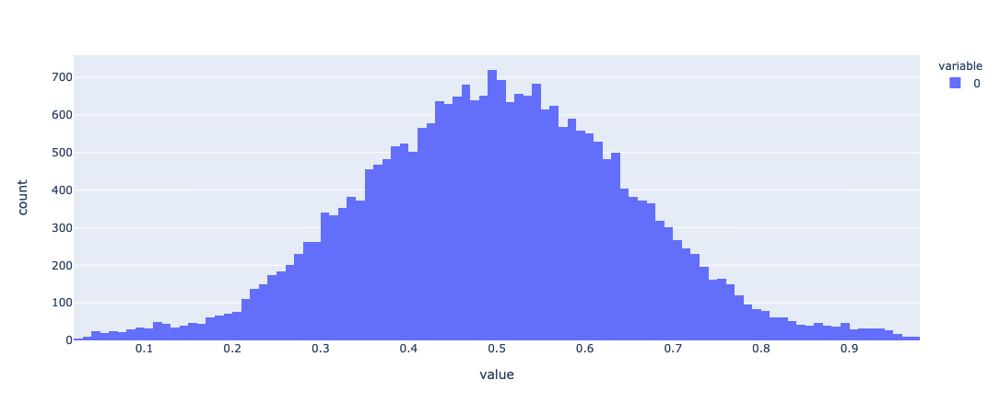

In [36]:
# Sample instances that are right around the decision threshold of 0.5
import plotly.express as px
px.histogram(preds)

In [38]:
selected_range = (0.45, 0.55)
selected = preds[(preds>=selected_range[0]) & (preds<=selected_range[1])]
selected

8         0.457657
20        0.542793
29        0.461053
40        0.490630
52        0.493428
            ...   
110825    0.542131
110847    0.462007
110895    0.504680
110917    0.460940
110921    0.485459
Length: 6658, dtype: float64

In [39]:
selected_range = (0.4, 0.6)
selected = preds[(preds>=selected_range[0]) & (preds<=selected_range[1])]
selected

8         0.457657
20        0.542793
29        0.461053
40        0.490630
52        0.493428
            ...   
110884    0.416240
110895    0.504680
110898    0.412040
110917    0.460940
110921    0.485459
Length: 12522, dtype: float64

## Check reblog rate within-community vs across-community

In [40]:
selected_data = splits['diff_comms'].loc[selected.index]
selected_data

,post_id_reblog,activity_time_epoch_reblog,activity_date_reblog,post_title_reblog,post_short_url_reblog,post_slug_reblog,post_type_reblog,post_caption_reblog,post_format_reblog,post_note_count_reblog,...,answer,audio,chat,link,photo,quote,text,video,comm_match_follower_followee,reblog_order
8,178669185821,1538496688,20181002,NaN,https://tmblr.co/ZdFHAw2cPWsiT,girlsluvbeyonce-on-the-run-tour-ii-santa-clara,photo,"<p><a href=""http://girlsluvbeyonce.tumblr.com/...",html,2029.0,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,2.074062,0.0
20,175970966974,1531793870,20180717,NaN,https://tmblr.co/Zr3Lbw2Zuhzs_,asylum-art-creative-sculptures-by-hedi-xandt,photo,"<p><a class=""tumblr_blog"" href=""http://asylum-...",html,88101.0,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,0.006964,-2.648264,2.074062,1.0
29,175954593076,1531758353,20180716,NaN,https://tmblr.co/ZYXmRy2ZtjWKq,NaN,photo,NaN,html,25313.0,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-0.001449,-1.831829,-0.002306,2.074062,1.0
40,175698439620,1531110432,20180709,NaN,https://tmblr.co/ZLewqj2ZeSMt4,despertandoconciencia,photo,"<p><a href=""https://despertandoconciencia.tumb...",html,326.0,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-2.074561,1.0
52,178850384948,1538995457,20181008,NaN,https://tmblr.co/ZzaiBf2caK4mq,therealnkdrose-the-worse-pain-ever-but-i-love,photo,"<p><a href=""https://therealnkdrose.tumblr.com/...",html,125.0,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,2.074062,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110884,176375896811,1532795019,20180728,NaN,https://tmblr.co/ZoMNDZ2aGqfhh,NaN,photo,NaN,html,11491.0,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,2.074062,0.0
110895,176894950790,1534033713,20180812,NaN,https://tmblr.co/ZZMk2Z2almhs6,uravitybang,photo,"<p><a href=""http://chalala-chan.tumblr.com/pos...",html,885.0,...,-0.004184,0.004551,-0.006132,0.004138,-0.003026,-0.001449,0.006964,-0.002306,-2.074561,0.0
110898,174722680584,1528551748,20180609,NaN,https://tmblr.co/ZwT8dg2YkI8S8,kvtes-its-ok-to-live-a-life-others-dont,quote,NaN,html,3155.0,...,-0.004184,0.004551,-0.006132,0.004138,1.545732,-5.359152,0.006964,-0.002306,2.074062,0.0
110917,180589788455,1543423455,20181128,NaN,https://tmblr.co/ZwkrHa2eB-Nqd,112718,photo,11/27/18,html,41.0,...,-0.004184,0.004551,-0.006132,0.004138,-1.551784,-0.001449,1.845757,-0.002306,2.074062,0.0


In [42]:
match_reblogged = sum(selected_data['community_follower_reblog']==selected_data['community_followee_reblog'])
nonmatch_reblogged = sum(selected_data['community_follower_reblog']==selected_data['community_followee_nonreblog'])
print(match_reblogged)
print(nonmatch_reblogged)

7195
5327


In [64]:
# Test for significant difference between reblog followee matches and nonreblog followee matches
from scipy.stats import chisquare
chisquare([[match_reblogged, nonmatch_reblogged], [nonmatch_reblogged, match_reblogged]])
# Can't do effect size, though

Power_divergenceResult(statistic=array([278.66347229, 278.66347229]), pvalue=array([1.46842283e-62, 1.46842283e-62]))

In [65]:
278.66/12522

0.022253633604855456

In [49]:
# Try separating instances into posts (from pairs of posts)
selected_data['instance_id'] = selected_data.index
posts = pd.wide_to_long(selected_data, stubnames=['community_followee'], i='instance_id', j='reblogged', suffix=r'_(non)?reblog')
posts

,,activity_date_nonreblog,post_format_reblog,post_id_nonreblog,post_tags_nonreblog_str,mentions_reblog_str,tumblog_id_followee_nonreblog,is_group_blog_follower_reblog,reblog_order,fashion personal funny memes gayman,updated_time_epoch_followee_reblog,...,post_id_reblog,q photography nature culo words,tumblr_blog_description_followee_nonreblog,updated_time_epoch_followee_nonreblog,post_content_nonreblog_str,is_group_blog_followee_reblog,post_type_reblog,is_primary_followee_reblog,comm_match_follower_followee,community_followee
instance_id,reblogged,,,,,,,,,,,,,,,,,,,,,
8,_reblog,20181002.0,html,151504304679,[],[],2761597,False,0.0,0.003131,1.51916e+12,...,178669185821,-0.004559,"<a title=""return to top"" href=""#"" style=""posit...",1527284966000,"[caption -> <p><a class=""tumblr_blog"" href=""ht...",False,photo,False,2.074062,3.0
20,_reblog,20180717.0,html,175970673635,[],[],6579527,False,1.0,0.003131,NaN,...,175970966974,-0.004559,"Geeky, musical, passionate, rainbow-vomiting m...",1529086403000,"[caption -> <p><a href=""https://geniushuri.tum...",False,photo,False,2.074062,49.0
29,_reblog,20180716.0,html,158928953669,[when I reblogged this it had my icon instead ...,[],8472541,False,1.0,0.003131,1.52149e+12,...,175954593076,-0.004559,◦ forest ◦ 24 ◦ ig @fogirot ◦,1527856044000,"[body -> <p><a href=""http://acoolguy.tumblr.co...",False,photo,False,2.074062,6.0
40,_reblog,20180709.0,html,175698323157,[],[],10809628,False,1.0,0.003131,1.52533e+12,...,175698439620,-0.004559,"<p>gabriela, 22, cg/ms *pisciana*</p>",1560922568000,"[caption -> , format -> html, mentions -> {}, ...",False,photo,False,-2.074561,3.0
52,_reblog,20181008.0,html,178850465174,[],[],15720248,False,0.0,0.003131,1.52578e+12,...,178850384948,-0.004559,<p>Name's Brooklyn . Live in Oregon . I like b...,NaN,"[caption -> , format -> html, mentions -> {}, ...",False,photo,False,2.074062,49.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110884,_nonreblog,20180728.0,html,176375305027,[(aesthetic) the wine dark depths whispers my ...,[],388769377,False,0.0,0.003131,NaN,...,176375896811,-0.004559,"the <a href=""https://theimperiusrex.tumblr.com...",1543550386000,"[caption -> <p><a href=""http://just-usmadd.tum...",False,photo,False,2.074062,22.0
110895,_nonreblog,20180812.0,html,176895055047,[],[],401478178,False,0.0,0.003131,1564208938000,...,176894950790,-0.004559,<p>🍂lulu. [nb]. omni. they/she.🍂</p>,1546206365000,"[caption -> <p><a href=""http://rainekk.tumblr....",False,photo,False,-2.074561,22.0
110898,_nonreblog,20180609.0,html,174723134803,[],[],408022186,False,0.0,0.003131,1545362797000,...,174722680584,-0.004559,<p>س '٩٦ v</p>,1530869017000,"[caption -> , format -> html, mentions -> {}, ...",False,quote,False,2.074062,5.0


In [51]:
[col for col in posts.columns if 'community' in col]

['community_follower_reblog', 'community_followee']

In [52]:
posts['comm_matches'] = posts['community_follower_reblog'] == posts['community_followee']
posts['comm_matches']

instance_id  reblogged 
8            _reblog       False
20           _reblog        True
29           _reblog        True
40           _reblog       False
52           _reblog       False
                           ...  
110884       _nonreblog     True
110895       _nonreblog    False
110898       _nonreblog     True
110917       _nonreblog     True
110921       _nonreblog     True
Name: comm_matches, Length: 25044, dtype: bool

In [53]:
wi_comm = posts.loc[posts['comm_matches']]
across_comm = posts.loc[~posts['comm_matches']]
print(len(wi_comm))
print(len(across_comm))

12522
12522


In [63]:
# Calculate reblog rates wi_comm/across_comm
wi_comm_reblogs = sum(wi_comm.index.get_level_values('reblogged') == '_reblog')
wi_comm_nonreblogs = sum(wi_comm.index.get_level_values('reblogged') == '_nonreblog')
across_comm_reblogs = sum(across_comm.index.get_level_values('reblogged') == '_reblog')
across_comm_nonreblogs = sum(across_comm.index.get_level_values('reblogged') == '_nonreblog')
print(wi_comm_reblogs)
print(wi_comm_nonreblogs)
print(across_comm_reblogs)
print(across_comm_nonreblogs)

7195
5327
5327
7195


In [68]:
from scipy.stats import chi2_contingency
cont = [[7195, 5327], [5327, 7195]]
chi2, pvalue, _, _ = chi2_contingency(cont)
print(chi2)
print(pvalue)

556.73039450567
4.323862417124989e-123


In [72]:
len(posts)

25044

In [71]:
chi2/len(posts)

0.022230090820382926